# Chapter 9
# Visual Explanations

## Preparations

In [2]:
import math
import numpy as np
import pandas as pd

import catboost as cb

import matplotlib.pyplot as plt 
import shap
from pdpbox import pdp, info_plots
from PyALE import ale
from lime.lime_tabular import LimeTabularExplainer

In [3]:
hdma_df = pd.read_csv('..//data/hmda_Ch8.csv')
hdma_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300000 entries, 0 to 299999
Data columns (total 17 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   train                      300000 non-null  object 
 1   high_priced                300000 non-null  float64
 2   interest_rate              300000 non-null  float64
 3   loan_amount                300000 non-null  float64
 4   loan_to_value_ratio        300000 non-null  float64
 5   no_intro_rate_period       300000 non-null  int64  
 6   intro_rate_period          300000 non-null  int64  
 7   property_value             300000 non-null  float64
 8   income                     300000 non-null  float64
 9   debt_to_income_ratio       300000 non-null  float64
 10  term_360                   300000 non-null  float64
 11  conforming                 300000 non-null  float64
 12  state_target_encoded       300000 non-null  float64
 13  product_type_conventional  30

In [4]:
rand = 42
class_l = ['low priced','high priced']

X = hdma_df.drop(['train','high_priced'], axis=1)
y = hdma_df['high_priced']

X_train, X_test = X[hdma_df.train == 'train'], X[hdma_df.train == 'valid']
y_train, y_test = y[hdma_df.train == 'train'], y[hdma_df.train == 'valid']

In [5]:
cb_mdl = cb.CatBoostClassifier()
cb_mdl.load_model('..//models/high_priced.cbm')
print("Model is fitted?: %s" % cb_mdl.is_fitted())

Model is fitted?: True


## Global explanations

In [6]:
cb_explainer = shap.Explainer(cb_mdl)
cb_shap = cb_explainer(X_test)

In [7]:
print(type(cb_explainer))

<class 'shap.explainers._tree.Tree'>


In [8]:
print("Values dimensions: %s" % (cb_shap.values.shape,)) 
print("Data dimensions:   %s" % (cb_shap.data.shape,))

Values dimensions: (59490, 15)
Data dimensions:   (59490, 15)


### SHAP Bar Plot

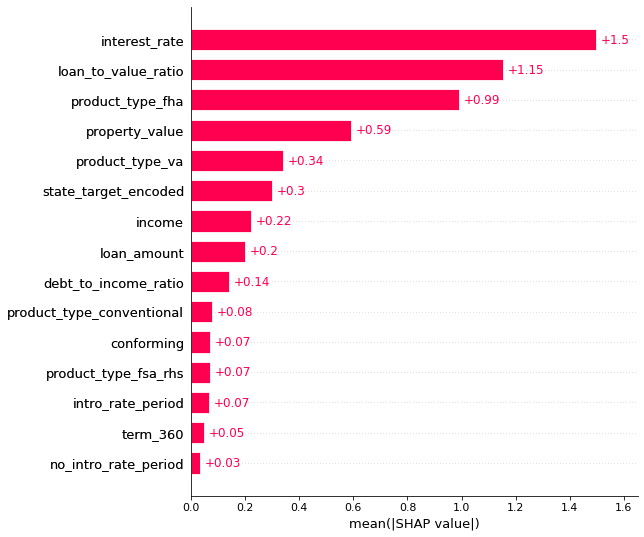

In [9]:
shap.plots.bar(cb_shap, max_display=15)

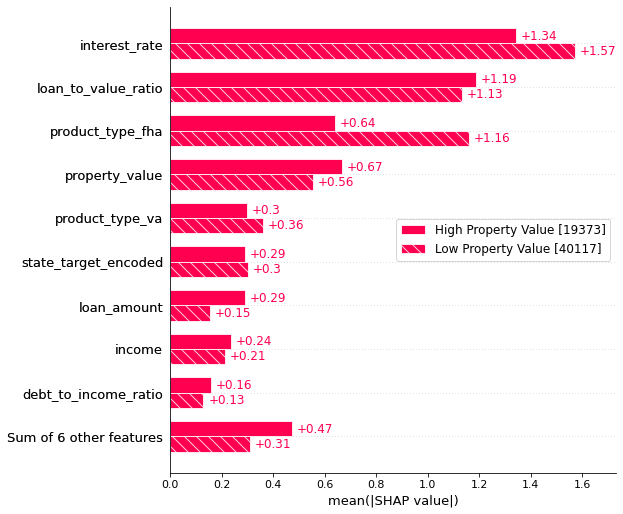

In [10]:
property_value_cohort = np.where(X_test.property_value > X.property_value.quantile(0.66),\
                                 "High Property Value", "Low Property Value")
shap.plots.bar(cb_shap.cohorts(property_value_cohort).abs.mean(0))

### SHAP Beeswarm Plot

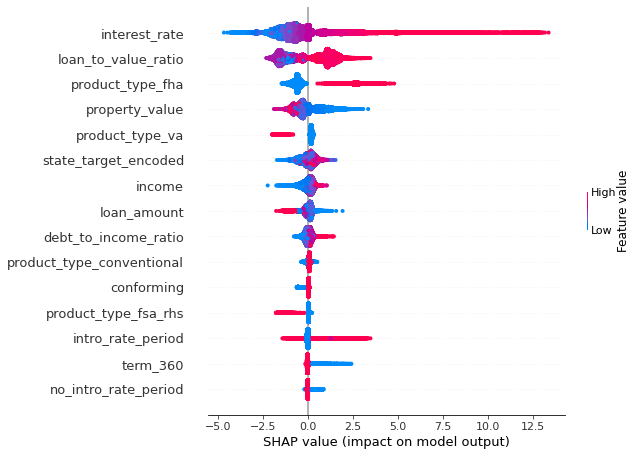

In [11]:
shap.plots.beeswarm(cb_shap, max_display=15)

## Feature summary explanations

### Partial Dependence Plot (PDP)

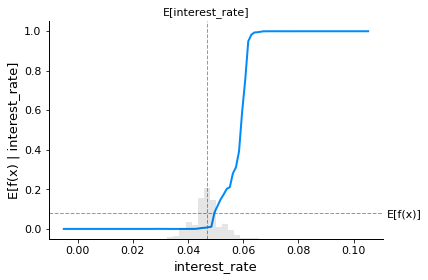

In [12]:
shap.plots.partial_dependence("interest_rate", cb_mdl.predict, X_test,\
                              ice=False, model_expected_value=True, feature_expected_value=True)

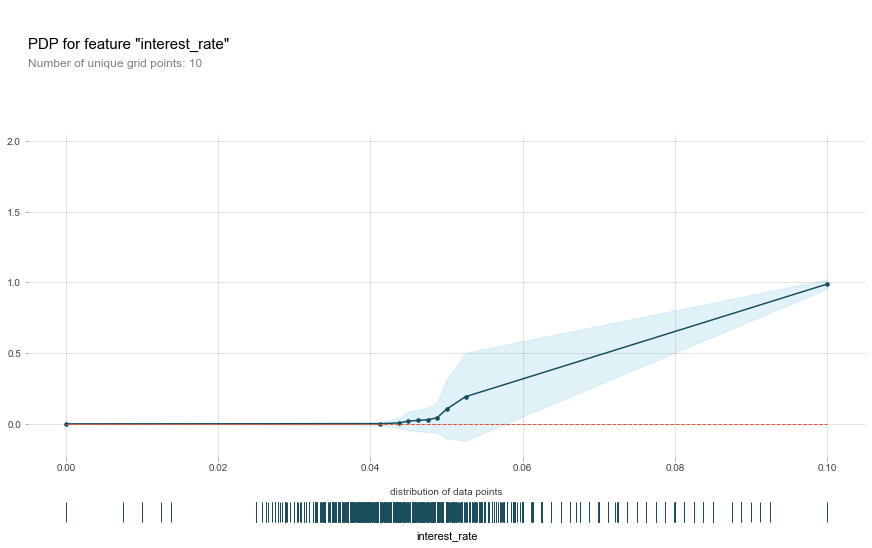

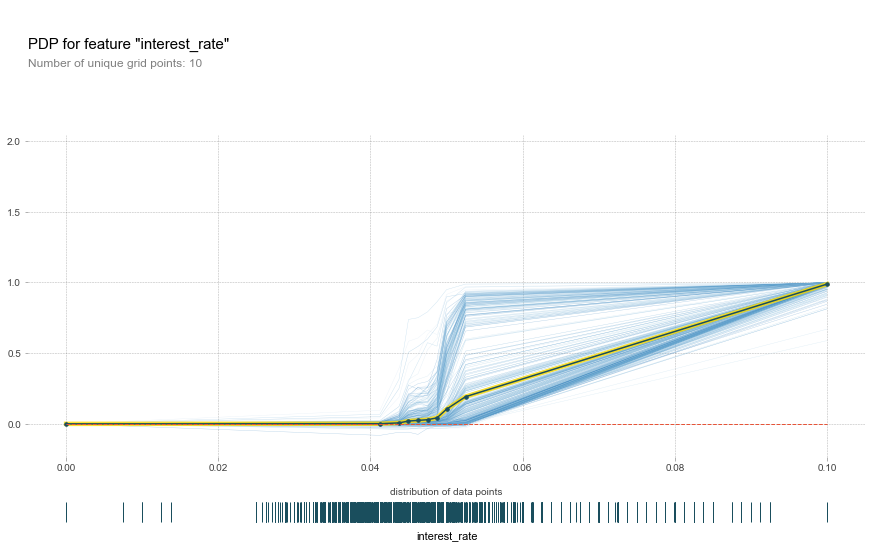

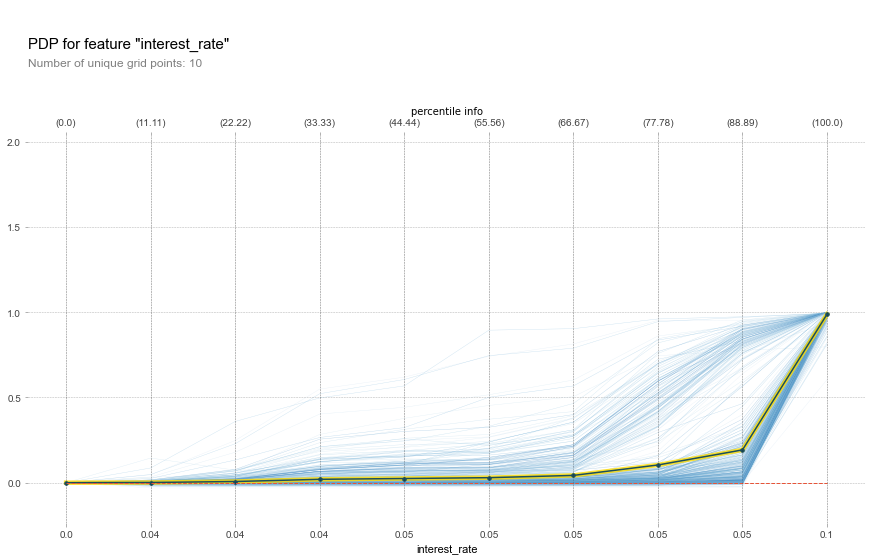

In [13]:
pdp_single_feature = pdp.pdp_isolate(
    model=cb_mdl, dataset=X_test, model_features=X_test.columns,\
    feature='interest_rate')

fig, axes = pdp.pdp_plot(pdp_single_feature, 'interest_rate',\
                         plot_pts_dist=True)
plt.show()

fig, axes = pdp.pdp_plot(pdp_single_feature, 'interest_rate',\
                         plot_pts_dist=True, plot_lines=True,\
                         frac_to_plot=0.01)
plt.show()

fig, axes = pdp.pdp_plot(pdp_single_feature, 'interest_rate',\
                         x_quantile=True, plot_lines=True,\
                         frac_to_plot=0.01, show_percentile=True)
plt.show()

In [14]:
cont_feature_l = ['interest_rate', 'loan_to_value_ratio', 'property_value',\
                  'state_target_encoded', 'income', 'loan_amount', 'debt_to_income_ratio',\
                  'intro_rate_period']

product_type_feature_l = ['product_type_fha', 'product_type_va', 'product_type_conventional',\
                          'product_type_fsa_rhs']

bin_feature_l = ['conforming', 'term_360', 'no_intro_rate_period']

cat_feature_l = product_type_feature_l + bin_feature_l

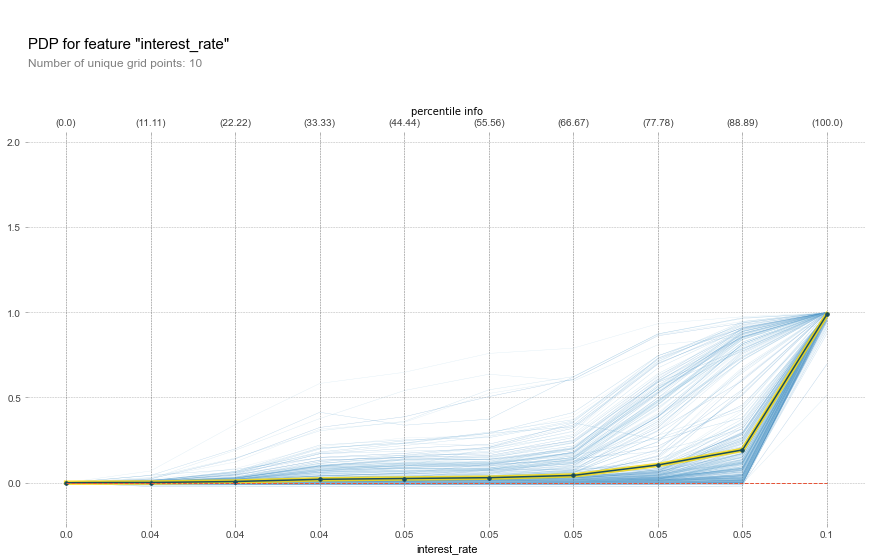

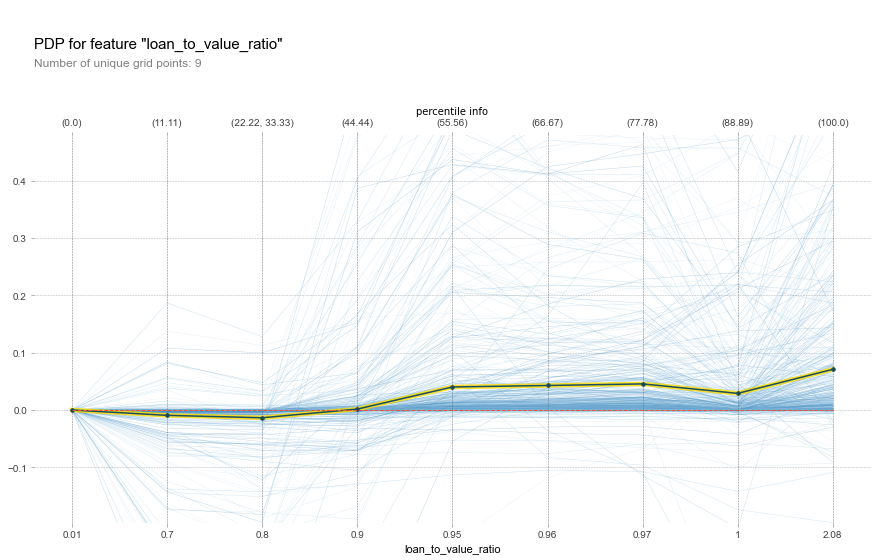

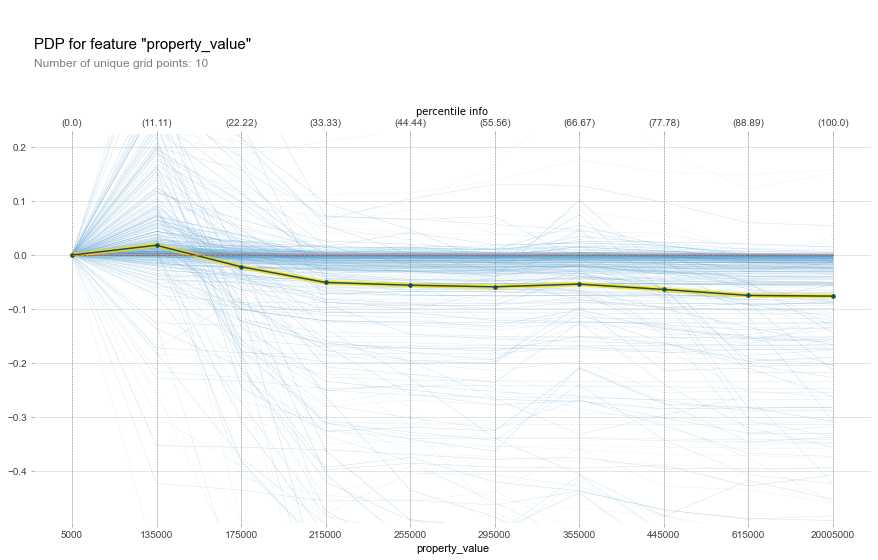

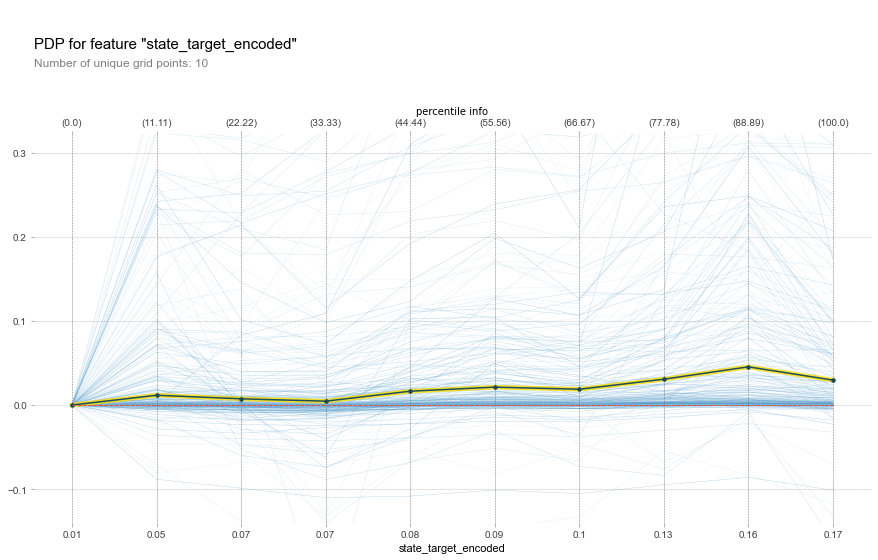

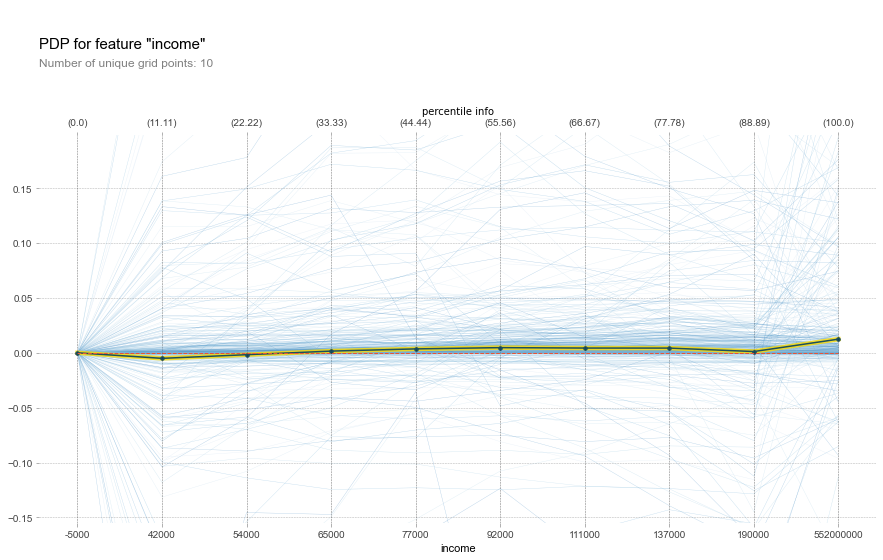

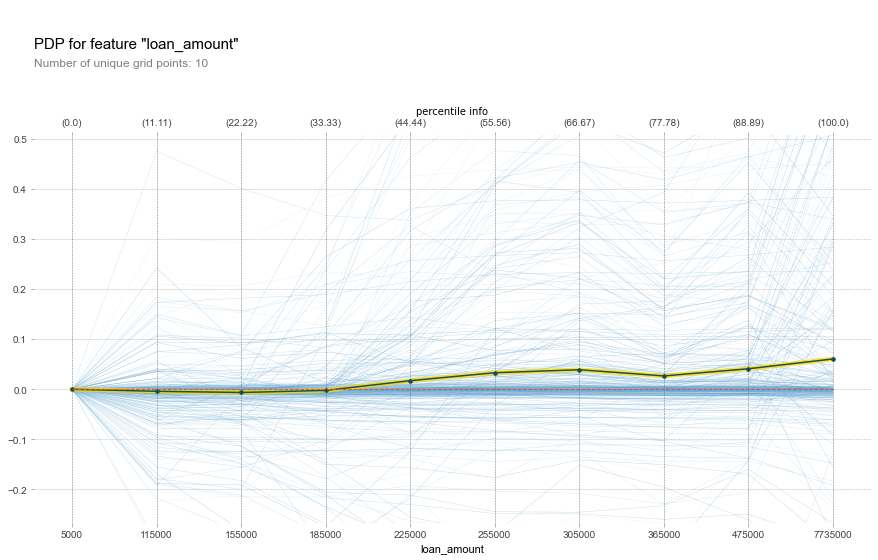

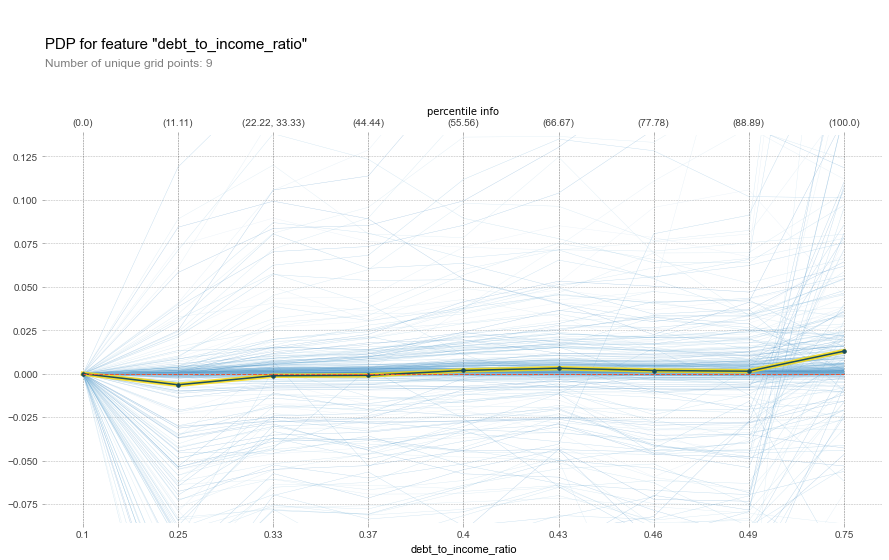

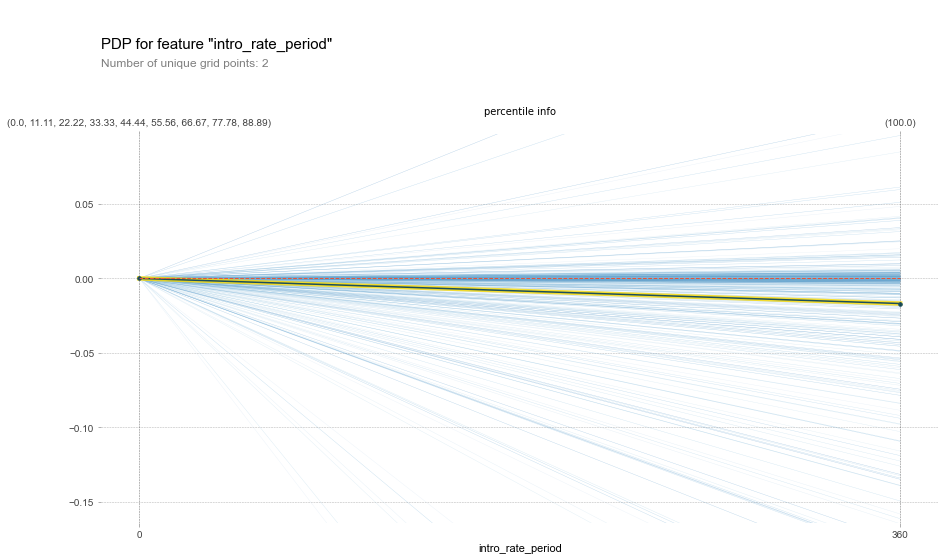

In [15]:
for f, feature in enumerate(cont_feature_l):
    pdp_single_feature = pdp.pdp_isolate(
        model=cb_mdl, dataset=X_test, model_features=X_test.columns,\
        feature=feature)
    fig, axes = pdp.pdp_plot(pdp_single_feature, feature,\
                             x_quantile=True, plot_lines=True,\
                             frac_to_plot=0.01, show_percentile=True)
    plt.show()

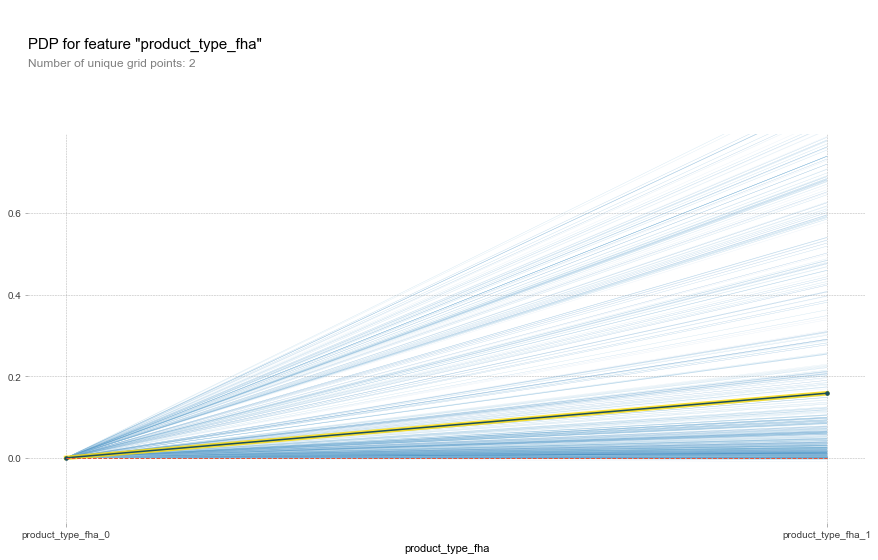

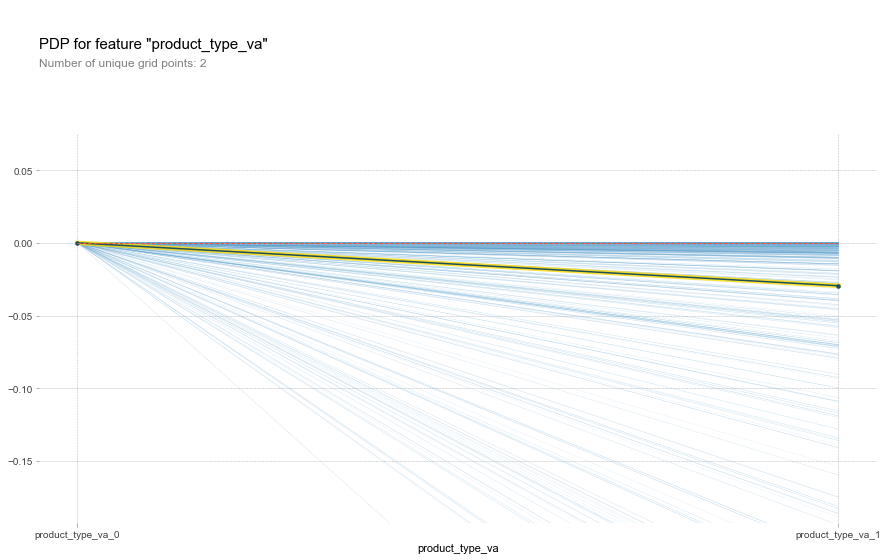

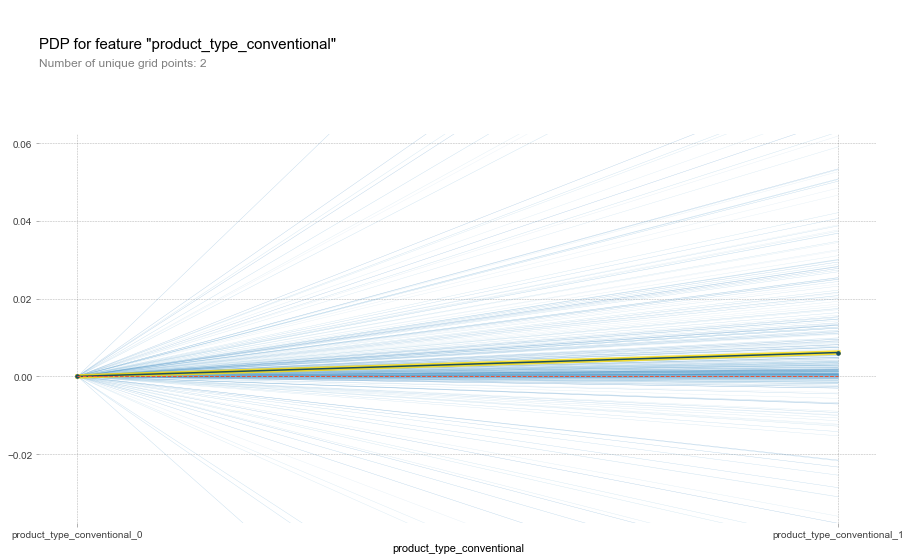

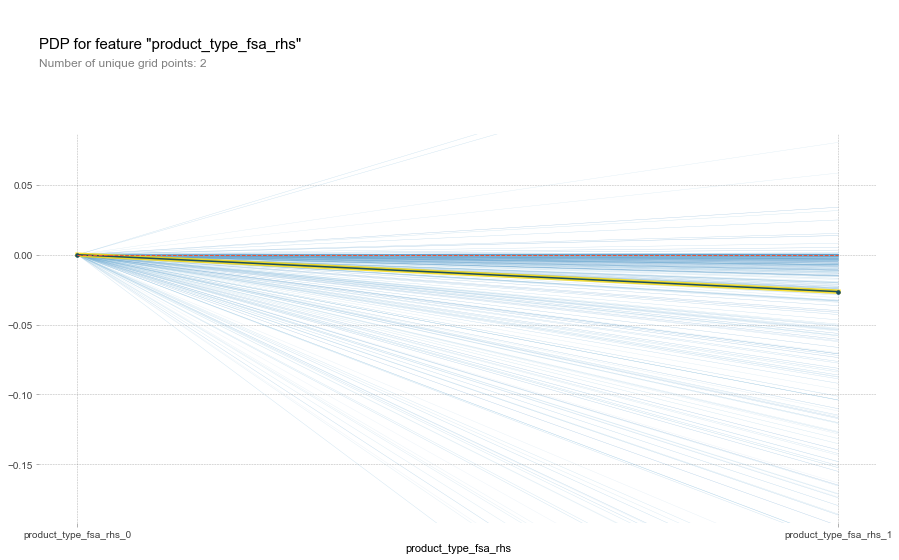

In [16]:
for f, feature in enumerate(product_type_feature_l):
    pdp_single_feature = pdp.pdp_isolate(
        model=cb_mdl, dataset=X_test, model_features=X_test.columns, feature=feature
    )
    fig, axes = pdp.pdp_plot(pdp_single_feature, feature,\
                             x_quantile=True, plot_lines=True,\
                             frac_to_plot=0.01, show_percentile=True)
    plt.show()

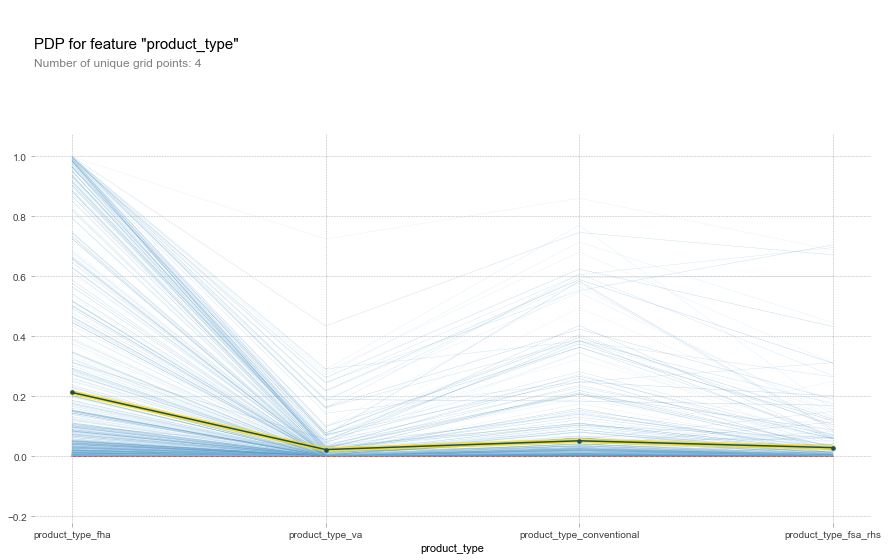

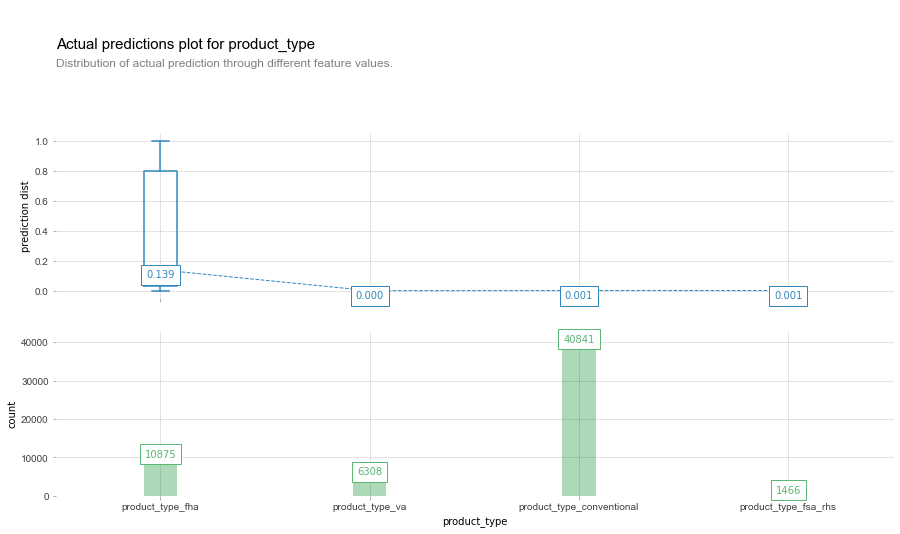

In [17]:
pdp_multi_feature = pdp.pdp_isolate(
    model=cb_mdl, dataset=X_test, model_features=X_test.columns,\
    feature=product_type_feature_l
)
fig, axes = pdp.pdp_plot(pdp_multi_feature, 'product_type',\
                         x_quantile=True, plot_lines=True,\
                         frac_to_plot=0.01, center=False)
plt.show()

fig, axes, summary_df = info_plots.actual_plot(
    model=cb_mdl, X=X_test, feature=product_type_feature_l,\
    feature_name='product_type')
plt.show()

In [18]:
print(y_test[X_test.product_type_conventional == 1].\
              describe(percentiles=[.9,.95,.975,.99]))

count    40841.000000
mean         0.042359
std          0.201410
min          0.000000
50%          0.000000
90%          0.000000
95%          0.000000
97.5%        1.000000
99%          1.000000
max          1.000000
Name: high_priced, dtype: float64


In [19]:
print(y_test[X_test.product_type_va == 1].\
              describe(percentiles=[.9,.95,.975,.99]))

print(y_test[X_test.product_type_fsa_rhs== 1].\
                describe(percentiles=[.9,.95,.975,.99])) #REMOVE CELL

count    6308.000000
mean        0.006817
std         0.082288
min         0.000000
50%         0.000000
90%         0.000000
95%         0.000000
97.5%       0.000000
99%         0.000000
max         1.000000
Name: high_priced, dtype: float64
count    1466.000000
mean        0.011596
std         0.107096
min         0.000000
50%         0.000000
90%         0.000000
95%         0.000000
97.5%       0.000000
99%         1.000000
max         1.000000
Name: high_priced, dtype: float64


### SHAP Scatter Plot

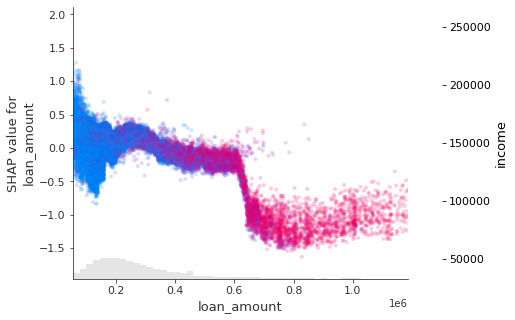

In [20]:
shap.plots.scatter(cb_shap[:,"loan_amount"], color=cb_shap[:,"income"],\
                   xmin="percentile(1)", xmax="percentile(99)", alpha=0.2)

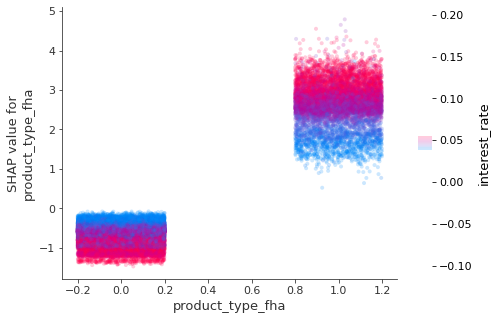

In [21]:
shap.plots.scatter(cb_shap[:,"product_type_fha"], color=cb_shap[:,"interest_rate"],\
                   x_jitter=0.4, alpha=0.2, hist=False)

### Accumulated Local Effects (ALE) Plots

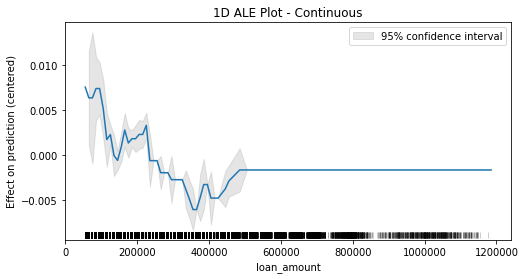

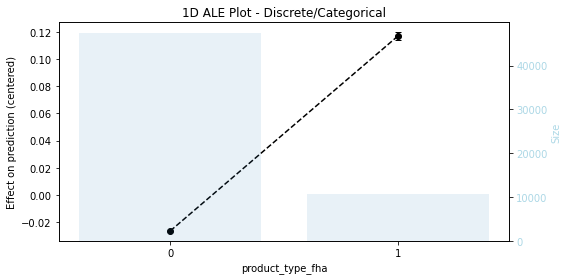

In [22]:
X_test_no_outliers = X_test[(X_test.loan_amount.quantile(.01) <= X_test.loan_amount) &\
                           (X_test.loan_amount <= X_test.loan_amount.quantile(.99)) &\
                           (X_test.property_value.quantile(.01) <= X_test.property_value) &\
                           (X_test.property_value <= X_test.property_value.quantile(.99))]

ale_effect = ale(X=X_test_no_outliers, model=cb_mdl, feature=['loan_amount'],\
                 feature_type='continuous', grid_size=80) 
plt.gca().ticklabel_format(useOffset=False, style='plain')
plt.show()

ale_effect = ale(X=X_test_no_outliers, model=cb_mdl, feature=['product_type_fha'],\
                 feature_type='discrete') 
plt.show()

## Local explanations

### Local Interpretable Model-Agnostic Explanations (LIME)

In [23]:
np.random.seed(rand)
cb_lime = LimeTabularExplainer(X_train.values, mode="classification",\
                               class_names=class_l, feature_names=X_train.columns.tolist(),\
                               kernel_width=1, verbose=True)

In [24]:
i = 111
print("Observed:  %s" % y_test.iloc[i])
cb_lime_exp = cb_lime.explain_instance(X_test.iloc[i].values, cb_mdl.predict_proba)
cb_lime_exp.show_in_notebook()

Observed:  1.0
Intercept -0.14251735468252838
Prediction_local [0.66583816]
Right: 0.9572985393991829


In [25]:
i = 59487
print("Observed:  %s" % y_test.iloc[i])
cb_lime_exp = cb_lime.explain_instance(X_test.iloc[i].values, cb_mdl.predict_proba)
cb_lime_exp.show_in_notebook()

Observed:  0.0
Intercept 0.06033751901875875
Prediction_local [0.13972957]
Right: 0.009997711201951831


### SHAP Local Bar & Waterfall Plots

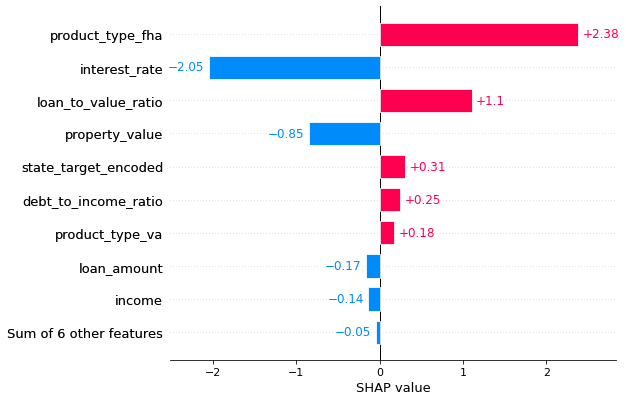

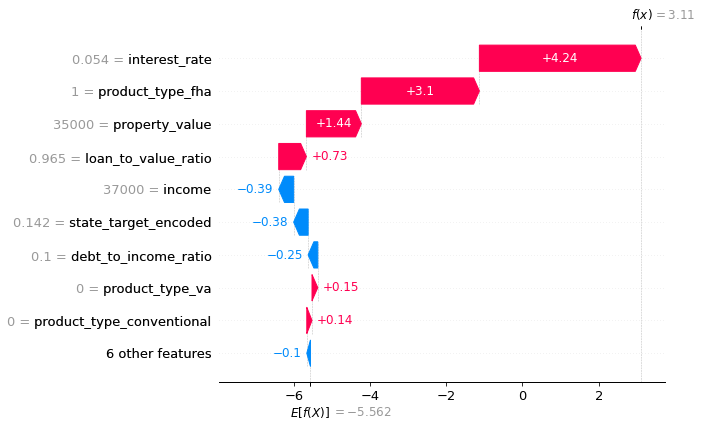

In [26]:
shap.plots.bar(cb_shap[59487])

shap.plots.waterfall(cb_shap[111])

### SHAP Force Plots

In [27]:
shap.initjs()

In [28]:
shap.plots.force(cb_shap[111])

In [29]:
shap.plots.force(cb_shap[59487])

### SHAP Decision Plots

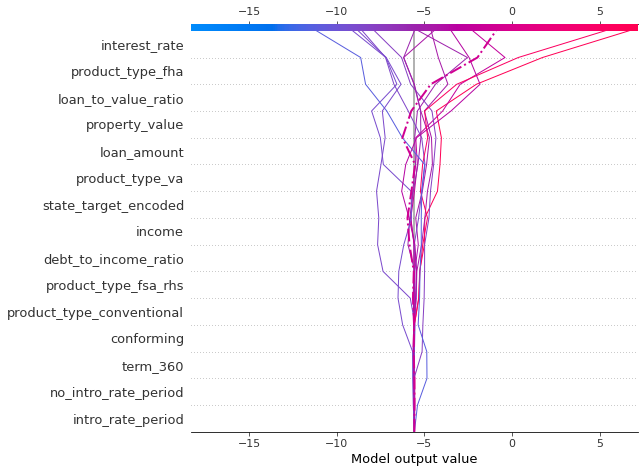

In [30]:
shap.decision_plot(cb_explainer.expected_value, cb_shap.values[16:30],\
                   X_test.iloc[16:30], highlight=13)

In [31]:
print(cb_mdl.predict_proba(X_test.iloc[29:30]))

[[0.71304864 0.28695136]]


In [32]:
cb_shap.values[np.r_[16,25,29]] #REMOVE CELL

array([[ 4.93774622e+00,  7.78457080e-02,  2.28779002e+00,
        -5.42209815e-03,  1.05266345e-02, -2.90630403e-01,
         2.62380430e-02,  2.67965477e-01, -3.40967406e-02,
         2.62404893e-02,  7.22124868e-01,  2.46444737e-01,
         3.77009510e+00,  5.68118855e-02,  1.43774607e-01],
       [ 4.95718582e+00,  2.87310775e-01,  1.83478771e+00,
        -1.83346931e-03,  1.91513319e-02, -1.73185044e-01,
         2.70342601e-01,  1.62111072e-01, -4.42384532e-02,
         2.62404893e-02, -4.03403598e-01,  2.54816714e-01,
         3.50601570e+00,  5.98668349e-02,  1.24748545e-01],
       [ 1.05567396e+00, -7.20756816e-01,  1.11151429e+00,
        -1.88962704e-03,  2.86341882e-03,  5.03946860e-01,
        -1.12888861e-01, -2.46949945e-01, -4.22279258e-02,
         2.24591315e-02,  2.24425759e-01, -6.33670565e-02,
         2.66215124e+00,  4.79909394e-02,  2.08614567e-01]])

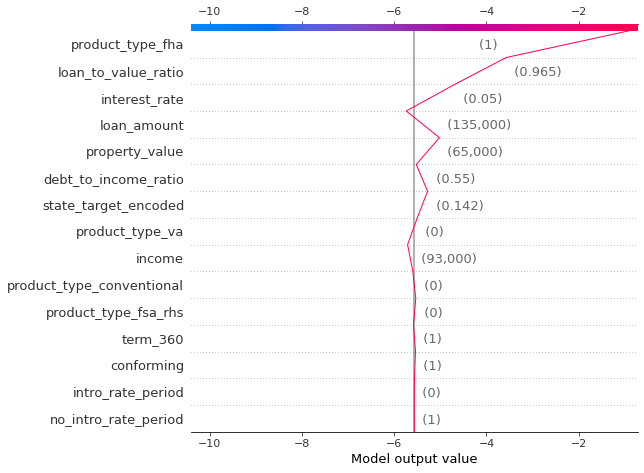

In [33]:
shap.decision_plot(cb_explainer.expected_value, cb_shap.values[29],\
                   X_test.iloc[29])

## Feature interactions

### SHAP Bar Plot with Clustering

16it [02:41, 11.52s/it]                        


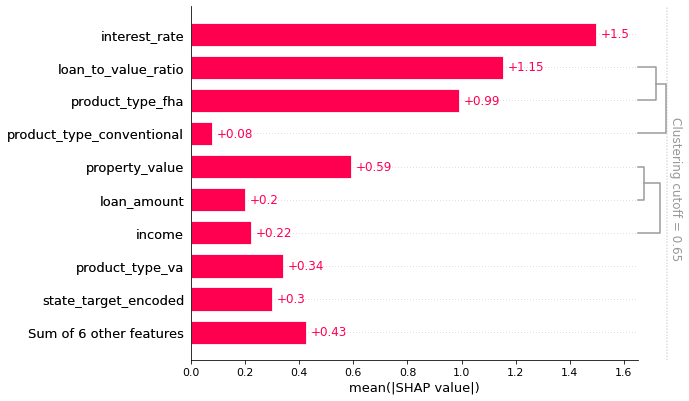

In [34]:
clustering = shap.utils.hclust(X, y)

shap.plots.bar(cb_shap, clustering=clustering, clustering_cutoff=0.65)

### 2D Accumulated Local Effects (ALE) Plots

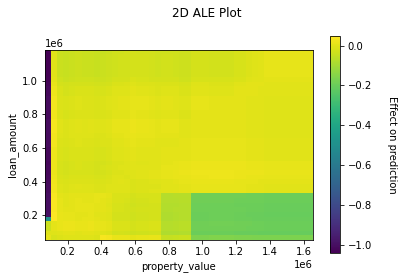

In [35]:
features_l = ["loan_amount", "property_value"]

ale_effect = ale(X=X_test_no_outliers, model=cb_mdl, feature=features_l,\
                 feature_type='continuous', grid_size=50) 
plt.show()

In [36]:
print(clustering)

[[ 1.          5.          0.1504094   2.        ]
 [ 2.         12.          0.41907907  2.        ]
 [ 6.         15.          0.4959752   3.        ]
 [11.         16.          0.63638431  3.        ]
 [ 9.         17.          0.88476741  4.        ]
 [ 7.         18.          0.90260118  4.        ]
 [ 4.         19.          0.97972441  5.        ]
 [ 0.         10.          0.98085457  2.        ]
 [14.         20.          0.99166238  5.        ]
 [21.         22.          0.99541217  7.        ]
 [ 8.         23.          0.99735129  6.        ]
 [13.         25.          0.99902111  7.        ]
 [ 3.         24.          1.          8.        ]
 [26.         27.          1.         15.        ]]


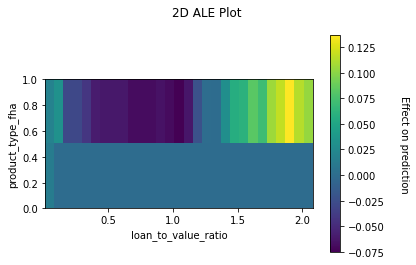

In [37]:
features_l = ["product_type_fha", "loan_to_value_ratio"]

ale_effect = ale(X=X_test, model=cb_mdl, feature=features_l,\
                 feature_type='continuous', grid_size=50) 
plt.gca().ticklabel_format(useOffset=False, style='plain')
plt.show()

### PDP Interactions Plots

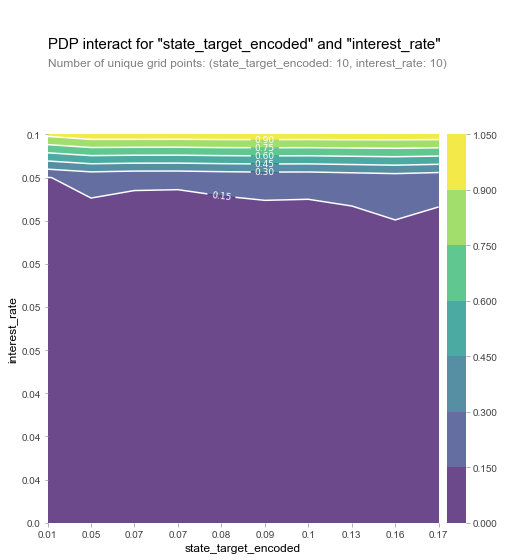

In [38]:
features_l = ["state_target_encoded", "interest_rate"]

pdp_interaction_feature = pdp.pdp_interact(
    model=cb_mdl, dataset=X_test, model_features=X_test.columns, features=features_l
)
fig, axes = pdp.pdp_interact_plot(
    pdp_interact_out=pdp_interaction_feature, feature_names=features_l,\
    plot_type='contour', x_quantile=True)
plt.show()

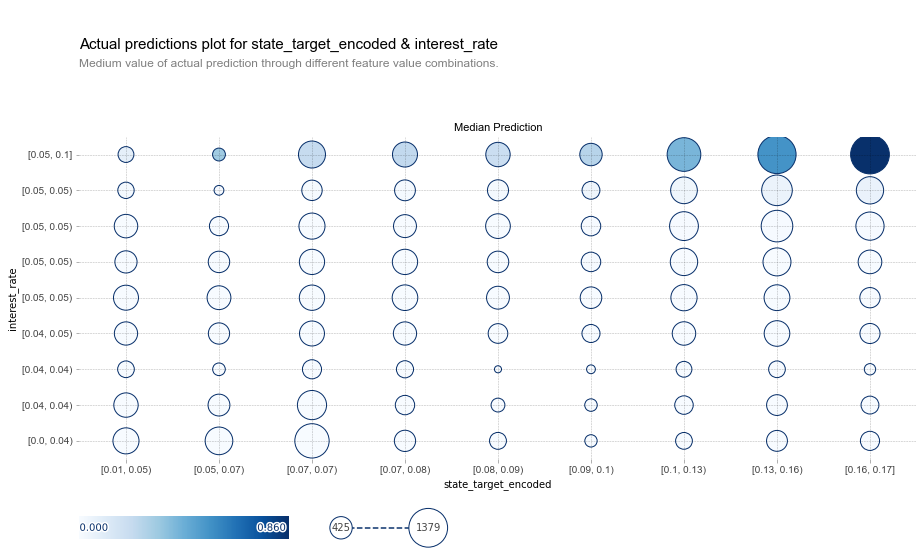

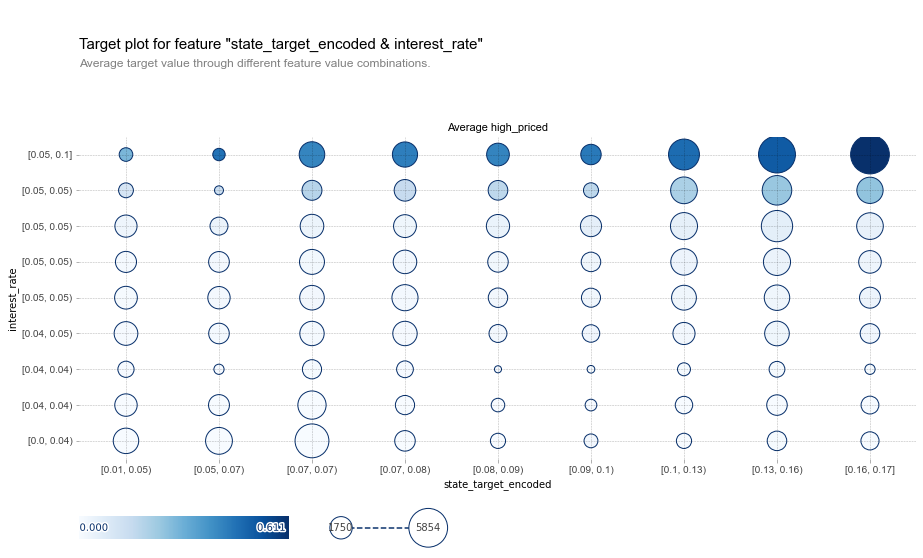

In [39]:
fig, axes, summary_df = info_plots.actual_plot_interact(
    model=cb_mdl, X=X_test, features=features_l, feature_names=features_l)
plt.show()

fig, axes, summary_df = info_plots.target_plot_interact(
    df=X_train.join(y_train), target='high_priced', features=features_l,\
    feature_names=features_l)
plt.show()